This code is used to compute the mode field distribution in a planar slab waveguide.

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc
from scipy.optimize import root_scalar
from IPython.display import HTML
import matplotlib as mpl


In [14]:
# parameters
n1 = 1.5        # waveguide refractive index
n2 = 1.0        # substrate refractive index
n3 = 1.0        # cover refractive index
wvl = 500e-9    # wavelength
d = 3e-6       # waveguide thickness

k0 = 2 * np.pi / wvl  # free space wavenumber

## Calculate the number of modes
For TE mode,
$$\phi_c = arctan \frac{\sqrt{n_2^2 - n_3^2}}{\sqrt{n_1^2 - n_2^2}}$$
$$m_c = int[\frac{2d}{\lambda}\sqrt{n_1^2 - n_2^2} - \frac{\phi_c}{\pi}]$$

For TM mode,
$$\phi_c^{'} = arctan \frac{n_1^2}{n_3^2}\frac{\sqrt{n_2^2 - n_3^2}}{\sqrt{n_1^2 - n_2^2}}$$
$$m_c = int[\frac{2d}{\lambda}\sqrt{n_1^2 - n_2^2} - \frac{\phi_c^{'}}{\pi}]$$

In [15]:
# calculate the number of modes
def calculate_modes(n1, n2, n3, d, wvl, mode_Type='TE'):
    if mode_Type == 'TE':
        phi_c = np.arctan(np.sqrt(n2**2 - n3**2) / np.sqrt(n1**2 - n2**2))
    elif mode_Type == 'TM':
        phi_c = np.arctan((n1**2 / n3 ** 2) * (np.sqrt(n2**2 - n3**2) / np.sqrt(n1**2 - n2**2)))
    
    m = int(2*d / wvl * np.sqrt(n1**2 - n2**2) - phi_c / np.pi)
    if m < 0:
        m = 0
    return m

modes_count = calculate_modes(n1, n2, n3, d, wvl, mode_Type='TE')

For **TE** mode, 
$$Kd=m\pi + arctan\frac{\sqrt{\beta^2 - n_2^2k_0^2}}{K}+arctan\frac{\sqrt{\beta^2 - n_3^2k_0^2}}{K}$$

For **TM** mode,
$$Kd=m\pi + arctan\frac{n_1^2}{n_2^2}\frac{\sqrt{\beta^2 - n_2^2k_0^2}}{K}+arctan\frac{n_1^2}{n_3^2}\frac{\sqrt{\beta^2 - n_3^2k_0^2}}{K}$$

In [16]:
def plot_modes(n1, n2, n3, d, k0, modes_count, mode_type='TE'):
    
    Kc = k0 * np.sqrt(n1**2 - n2**2)    # cutoff wavenumber
    K_vals = np.linspace(1e-6, Kc - 1e-6, 1000)        # wavenumber range


    def f_mode(K_vals, mode_index):
        if mode_type == 'TE':
            return mode_index * np.pi + np.arctan(np.sqrt(n1**2 * k0**2 - K_vals**2 - n2**2 * k0**2) / K_vals) + np.arctan(np.sqrt(n1**2 * k0**2 - K_vals**2 - n3**2 * k0**2) / K_vals)   
        elif mode_type == 'TM':
            return mode_index * np.pi + np.arctan((n1 ** 2 / n2 ** 2) * np.sqrt(n1**2 * k0**2 - K_vals**2 - n2**2 * k0**2) / K_vals) + np.arctan((n1 ** 2 / n3 ** 2) * np.sqrt(n1**2 * k0**2 - K_vals**2 - n3**2 * k0**2) / K_vals)
    # plot the modes
    plt.figure(figsize=(10, 6))
    plt.plot(K_vals, K_vals * d)
    plt.text(K_vals[-1] * 0.97, K_vals[-1] * d + 0.3, 'kd', fontsize=9)
    for mode_index in range(modes_count + 1):
        f_vals = f_mode(K_vals, mode_index)
        plt.plot(K_vals, f_vals, label=f'Mode {mode_index}')
        plt.text(K_vals[10], f_vals[10] + 0.3, f'Mode {mode_index}', fontsize=9)
    plt.axhline(y=0, color='k', linestyle='--')
    plt.axvline(x=Kc, color='r', linestyle='--', label='Cutoff wavenumber')
    plt.title(f'Waveguide {mode_type} Modes')
    plt.xlabel('k')
    plt.ylabel('f(k)')


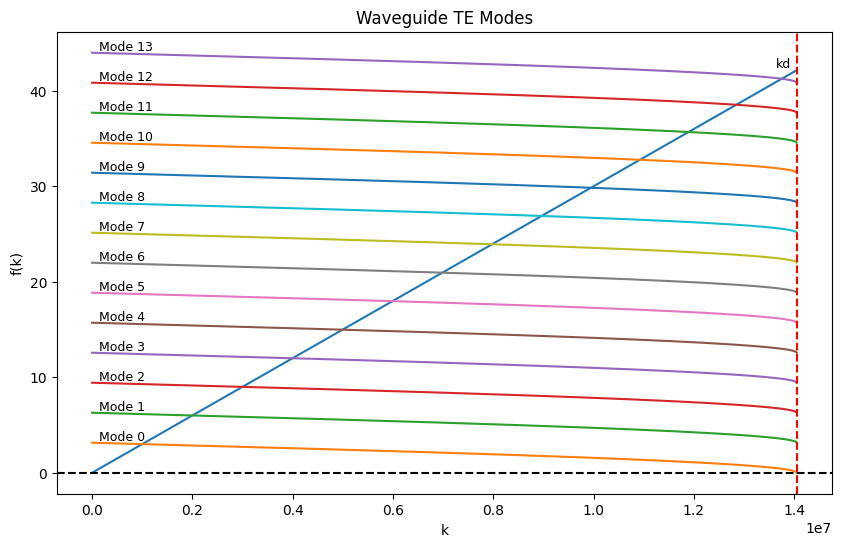

In [17]:
plot_modes(n1, n2, n3, d, k0, modes_count, mode_type='TE')

In [ ]:
# calculate the effective index
def find_intersection(n1, n2, n3, d, k0, mode_index=1, num_points=1000, mode_type='TE'):
    Kc = k0 * np.sqrt(n1**2 - n2**2)                # cutoff wavenumber
    K_vals = np.linspace(1e-6, Kc - 1e-6, num_points)    # make sure to avoid division by zero

    def f_mode(K_vals):
        beta_sq = n1 ** 2 * k0 ** 2 - K_vals ** 2
        if mode_type == 'TE':
            return (
                mode_index * np.pi +
                np.arctan(np.sqrt(beta_sq - n2**2 * k0**2) / K_vals) +
                np.arctan(np.sqrt(beta_sq - n3**2 * k0**2) / K_vals)
            )
        elif mode_type == 'TM':
            return (
                mode_index * np.pi +
                np.arctan((n1**2 / n2**2) * np.sqrt(beta_sq - n2**2 * k0**2) / K_vals) +
                np.arctan((n1**2 / n3**2) * np.sqrt(beta_sq - n3**2 * k0**2) / K_vals)
            )
    
    def equation(K_vals):
        return K_vals * d - f_mode(K_vals)
    
    # Find the intersection point
    for i in range(len(K_vals) - 1):
        if equation(K_vals[i]) * equation(K_vals[i + 1]) < 0:
            sol = root_scalar(equation, bracket=[K_vals[i], K_vals[i + 1]], method='brentq')
            if sol.converged:
                K_root = sol.root
                return K_root
    
    raise ValueError("No intersection found in the specified range.")

def calculate_field(n1, n2, n3, d, x, z, t, k0, K_root, mode_index, mode_type='TE'):
    Z, X = np.meshgrid(z, x)

    beta = np.sqrt(n1**2 * k0**2 - K_root**2)
    p = np.sqrt(beta**2 - n2**2 * k0**2)
    q = np.sqrt(beta**2 - n3**2 * k0**2)

    if mode_type == 'TE':
        phi = 1 / 2 * np.arctan(q / K_root) - 1 / 2 * np.arctan(p / K_root) + np.pi * mode_index / 2

        # amplitude
        A = 1
        B = A * np.cos(K_root * (d / 2) - phi)
        C = A * np.cos(K_root * (d / 2) + phi)

        def Ey_2D(x, z, t):
            Ey = np.zeros_like(x, dtype=complex)

            mask_center = np.abs(x) <= d / 2
            Ey[mask_center] = A * np.cos(K_root * x[mask_center] + phi) * np.exp(-1j * beta * z[mask_center]) * np.exp(1j * 2 * np.pi / wvl * t)
            mask_down = x < - d / 2
            Ey[mask_down] = B * np.exp(p * (x[mask_down] + d / 2)) * np.exp(-1j * beta * z[mask_down]) * np.exp(1j * 2 * np.pi / wvl * t)
            mask_up = x > d / 2
            Ey[mask_up] = C * np.exp(-1 * q * (x[mask_up] - d / 2)) * np.exp(-1j * beta * z[mask_up]) * np.exp(1j * 2 * np.pi / wvl * t)
            return Ey

        def Ey_field(X, Z, t):
            Ey = np.zeros_like(X, dtype=complex)
            for i in range(Z.shape[0]):
                Ey[i, :] = (Ey_2D(X[i, :], Z[i, :], t))
            return Ey
        
        Ey = Ey_field(X, Z, t)

        # calculate H field
        mu_0 = 4 * np.pi * 1e-7
        omega = 2 * np.pi / wvl * 3e8

        dx = x[1] - x[0]
        dz = z[1] - z[0]

        dEy_dx = np.gradient(Ey, dx, axis=0)

        Hx = -beta / (omega * mu_0) * Ey
        Hz = 1j / (omega * mu_0) * dEy_dx
        return Ey, Hx, Hz
    elif mode_type == 'TM':
        phi = 1 / 2 * np.arctan((n1**2 / n3**2) * (q / K_root)) - 1 / 2 * np.arctan((n1**2 / n2**2) * (p / K_root)) + np.pi * mode_index / 2

        # amplitude
        A = 1
        B = A * np.cos(K_root * (d / 2) - phi)
        C = A * np.cos(K_root * (d / 2) + phi)
        def Hy_2D(x, z, t):
            Hy = np.zeros_like(x, dtype=complex)

            mask_center = np.abs(x) <= d / 2
            Hy[mask_center] = A * np.cos(K_root * x[mask_center] + phi) * np.exp(-1j * beta * z[mask_center]) * np.exp(1j * 2 * np.pi / wvl * t)
            mask_down = x < - d / 2
            Hy[mask_down] = B * np.exp(p * (x[mask_down] + d / 2)) * np.exp(-1j * beta * z[mask_down]) * np.exp(1j * 2 * np.pi / wvl * t)
            mask_up = x > d / 2
            Hy[mask_up] = C * np.exp(-1 * q * (x[mask_up] - d / 2)) * np.exp(-1j * beta * z[mask_up]) * np.exp(1j * 2 * np.pi / wvl * t)
            return Hy
        def Hy_field(X, Z, t):
            Hy = np.zeros_like(X, dtype=complex)
            for i in range(Z.shape[0]):
                Hy[i, :] = (Hy_2D(X[i, :], Z[i, :], t))
            return Hy
        
        Hy = Hy_field(X, Z, t)
        # calculate E field
        eps_0 = 8.854e-12
        omega = 2 * np.pi / wvl * 3e8
        dx = x[1] - x[0]
        dz = z[1] - z[0]
        dHy_dx = np.gradient(Hy, dx, axis=0)
        Ex = beta / (omega * eps_0) * Hy
        Ez = -1j / (omega * eps_0) * dHy_dx
        return Hy, Ex, Ez

def field_animation(n1, n2, n3, d, x, z, t_vals, k0, K_root, mode_index, mode_type='TE'):
    Z, X = np.meshgrid(z, x)

    fig, ax = plt.subplots(figsize=(8, 5))
    cmap = plt.get_cmap('RdBu_r')
    field, _, _ = calculate_field(n1, n2, n3, d, x, z, t_vals[0], k0, K_root, mode_index=mode_index, mode_type=mode_type)
    img = ax.imshow(np.real(field), extent=[z[0]*1e6, z[-1]*1e6, x[0]*1e6, x[-1]*1e6], origin='lower',
                    cmap=cmap, vmin=-1, vmax=1, aspect='auto')

    waveguide_line1 = ax.axhline(y=(-d/2)*1e6, color='k', linestyle='--', linewidth=1, label='Waveguide Boundaries')
    waveguide_line2 = ax.axhline(y=(d/2)*1e6, color='k', linestyle='--', linewidth=1)

    cb = plt.colorbar(img, ax=ax)
    if mode_type == 'TE':
        cb.set_label('Re[E_y]')
    elif mode_type == 'TM':
        cb.set_label('Re[H_y]')
    ax.set_xlabel('z (μm)')
    ax.set_ylabel('x (μm)')
    if mode_type == 'TE':
        ax.set_title(f'TE_{mode_index} Mode: $E_y(x, z, t)$')
    elif mode_type == 'TM':
        ax.set_title(f'TM_{mode_index} Mode: $H_y(x, z, t)$')
    ax.legend(loc='upper right')
    %matplotlib notebook
    def update(frame):
        t = t_vals[frame]
        field, _, _ = calculate_field(n1, n2, n3, d, x, z, t, k0, K_root, mode_index=mode_index, mode_type=mode_type)
        img.set_data(np.real(field))
        return [img]

    ani = animation.FuncAnimation(fig, update, frames=len(t_vals), interval=50, blit=True)
    mpl.rcParams['animation.embed_limit'] = 50
    # ani.save("mode_field_animation.mp4", writer='ffmpeg', fps=20)
    return HTML(ani.to_jshtml())

## Visualize the field distributions for different modes

In [19]:
mode_index = 0
K_root = find_intersection(n1, n2, n3, d, k0, mode_index=mode_index, mode_type='TE')
x = np.linspace(-3/2 * d, 3/2 * d, 200)  # x range
z = np.linspace(0, 3 * d, 200)  # z range
t = 0  # time
t_vals = np.linspace(0, 1e-4, 50)


Ey, Hx, Hz = calculate_field(n1, n2, n3, d, x, z, t, k0, K_root, mode_index=mode_index, mode_type='TE')
Hy, Ex, Ez = calculate_field(n1, n2, n3, d, x, z, t, k0, K_root, mode_index=mode_index, mode_type='TM')
field_animation(n1, n2, n3, d, x, z, t_vals, k0, K_root, mode_index=mode_index, mode_type='TE')

In [8]:
field_animation(n1, n2, n3, d, x, z, t_vals, k0, K_root, mode_index=mode_index, mode_type='TM')

<IPython.core.display.Javascript object>

## The field at a given location and time instant

In [9]:
modes_index = [0, 1, 2]
K_roots = [find_intersection(n1, n2, n3, d, k0, mode_index=mode_index, mode_type='TE') for mode_index in modes_index]
x = np.linspace(-3/2 * d, 3/2 * d, 200)  # x range
z = np.linspace(0, 3 * d, 200)  # z range
t = 0  # time
t_vals = np.linspace(0, 1e-4, 50)


In [10]:
fields = [calculate_field(n1, n2, n3, d, x, z, t, k0, K_root, mode_index=mode_index, mode_type='TE') for K_root, mode_index in zip(K_roots, modes_index)]
fields = np.array(fields)

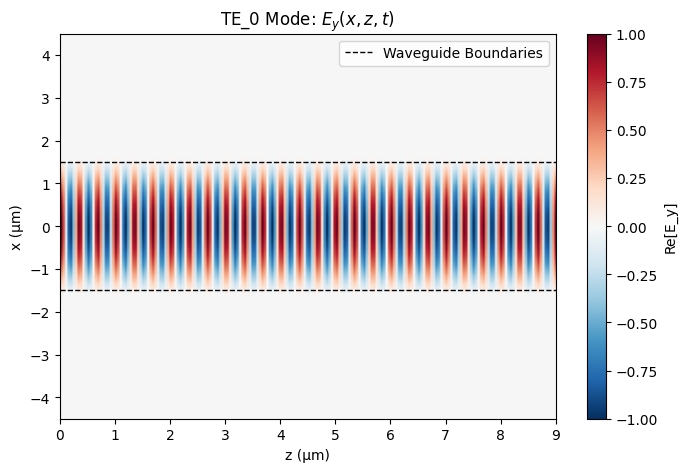

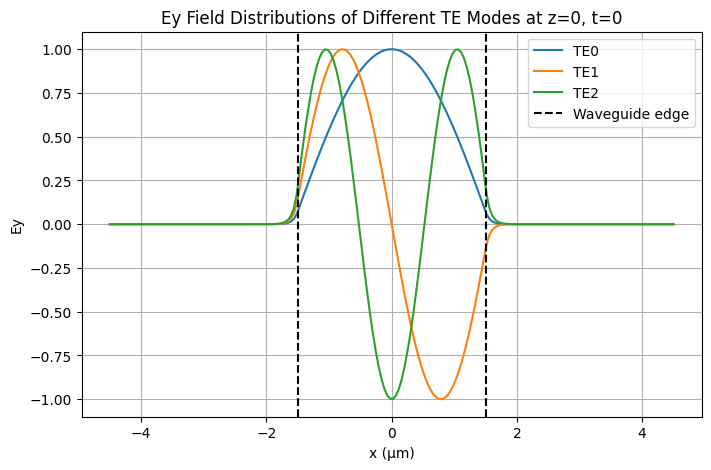

In [11]:
%matplotlib inline
plt.figure(figsize=(8, 5))  
plt.plot(x * 1e6, np.real(fields[0, 0, :, 0]), label='TE0')
plt.plot(x * 1e6, np.real(fields[1, 0, :, 0]), label='TE1')
plt.plot(x * 1e6, np.real(fields[2, 0, :, 0]), label='TE2')
plt.axvline(x=-d/2 * 1e6, color='k', linestyle='--', label='Waveguide edge')
plt.axvline(x=d/2 * 1e6, color='k', linestyle='--')
plt.title("Ey Field Distributions of Different TE Modes at z=0, t=0")
plt.xlabel("x (μm)")
plt.ylabel("Ey")
plt.grid(True)
plt.legend()
plt.show()


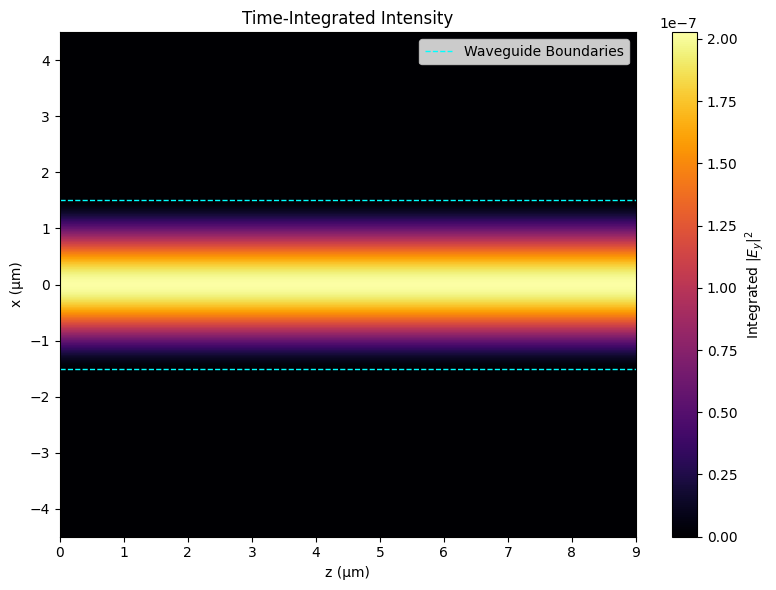

In [12]:
# calculate intensity
Z, X = np.meshgrid(z, x)
intensity_accum = np.zeros_like(X, dtype=float)

delta_t = t_vals[1] - t_vals[0]

for t in t_vals:
    Ey, Hx, _ = calculate_field(n1, n2, n3, d, x, z, t, k0, K_root, mode_index=mode_index, mode_type='TE')
    intensity_accum += 1 / 2 * np.real(- Ey * np.conj(Hx)) * delta_t

fig, ax = plt.subplots(figsize=(8, 6))
cmap = plt.get_cmap('inferno')
img = ax.imshow(intensity_accum, extent=[z[0]*1e6, z[-1]*1e6, x[0]*1e6, x[-1]*1e6],
                origin='lower', cmap=cmap, aspect='auto')
cb = plt.colorbar(img, ax=ax)
cb.set_label('Integrated $|E_y|^2$')
ax.set_xlabel('z (μm)')
ax.set_ylabel('x (μm)')
ax.set_title('Time-Integrated Intensity')

ax.axhline(y=(-d/2)*1e6, color='cyan', linestyle='--', linewidth=1, label='Waveguide Boundaries')
ax.axhline(y=(d/2)*1e6, color='cyan', linestyle='--', linewidth=1)
ax.legend()
plt.tight_layout()
plt.show()